# Football AI

Here I build a Football AI system to dig deeper into match stats! I'll use computer vision and machine learning to track players, determine which team is which, and even calculate stuff like ball possession and speed. This tutorial is perfect to get hands-on with sports analytics and see how AI can take our football analysis to the next level.

![football AI diagram](https://media.roboflow.com/notebooks/examples/football-ai-diagram.png)

In [ ]:
import os
from google.colab import userdata

os.environ["HF_TOKEN"] = userdata.get("HF_TOKEN")
os.environ["ROBOFLOW_API_KEY"] = userdata.get("ROBOFLOW_API_KEY")

In [ ]:
!nvidia-smi

Sun Nov  9 08:10:15 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   61C    P8             11W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Install dependencjes

**Note:** Let's install the `inference-gpu` library, which will be used to efficiently run our object detection and keypoint detection models on GPUs.

In [ ]:
!pip install -q gdown inference-gpu supervision transformers torch torchaudio torchvision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.7/105.7 kB 5.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.2/91.2 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.4/99.4 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.5/48.5 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 19.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 70.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.1/190.1 kB 17.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.9/75.9 kB 4.3 

**Note:** Let's install the sports repository directly from GitHub. The sports repository contains a variety of football-related utilities that we'll use along the way.

In [ ]:
!pip install -q git+https://github.com/roboflow/sports.git

  Preparing metadata (setup.py) ... done


**Note:** Let's make sure we have the latest features in the supervision library by installing version `0.25.1` or higher.

In [ ]:
!pip list | grep supervision

**Note:** Let's download a few sample videos from the [DFL - Bundesliga Data Shootout](https://www.kaggle.com/competitions/dfl-bundesliga-data-shootout) Kaggle competition using gdown.

In [ ]:
!gdown -O "0bfacc_0.mp4" "https://drive.google.com/uc?id=12TqauVZ9tLAv8kWxTTBFWtgt2hNQ4_ZF"
!gdown -O "2e57b9_0.mp4" "https://drive.google.com/uc?id=19PGw55V8aA6GZu5-Aac5_9mCy3fNxmEf"
!gdown -O "08fd33_0.mp4" "https://drive.google.com/uc?id=1OG8K6wqUw9t7lp9ms1M48DxRhwTYciK-"
!gdown -O "573e61_0.mp4" "https://drive.google.com/uc?id=1yYPKuXbHsCxqjA9G-S6aeR2Kcnos8RPU"
!gdown -O "121364_0.mp4" "https://drive.google.com/uc?id=1vVwjW1dE1drIdd4ZSILfbCGPD4weoNiu"

Downloading...
From: https://drive.google.com/uc?id=12TqauVZ9tLAv8kWxTTBFWtgt2hNQ4_ZF
To: /content/0bfacc_0.mp4
100% 19.9M/19.9M [00:00<00:00, 39.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=19PGw55V8aA6GZu5-Aac5_9mCy3fNxmEf
To: /content/2e57b9_0.mp4
100% 21.1M/21.1M [00:00<00:00, 33.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1OG8K6wqUw9t7lp9ms1M48DxRhwTYciK-
To: /content/08fd33_0.mp4
100% 19.9M/19.9M [00:00<00:00, 34.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1yYPKuXbHsCxqjA9G-S6aeR2Kcnos8RPU
To: /content/573e61_0.mp4
100% 18.9M/18.9M [00:00<00:00, 56.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1vVwjW1dE1drIdd4ZSILfbCGPD4weoNiu
To: /content/121364_0.mp4
100% 17.2M/17.2M [00:00<00:00, 42.5MB/s]


In [ ]:
import os
os.environ["ONNXRUNTIME_EXECUTION_PROVIDERS"] = "[CUDAExecutionProvider]"

In [ ]:
from inference import get_model
from google.colab import userdata

ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API_KEY')
PLAYER_DETECTION_MODEL_ID = "football-players-detection-3zvbc-hazem/2"
PLAYER_DETECTION_MODEL = get_model(model_id=PLAYER_DETECTION_MODEL_ID,
                                   api_key=ROBOFLOW_API_KEY)

ModelDependencyMissing: Your `inference` configuration does not support SAM model. Use pip install 'inference[sam]' to install missing requirements.To suppress this warning, set CORE_MODEL_SAM_ENABLED to False.
ModelDependencyMissing: Your `inference` configuration does not support SAM2 model. Use pip install 'inference[sam]' to install missing requirements.To suppress this warning, set CORE_MODEL_SAM2_ENABLED to False.
ModelDependencyMissing: Your `inference` configuration does not support Gaze Detection model. Use pip install 'inference[gaze]' to install missing requirements.To suppress this warning, set CORE_MODEL_GAZE_ENABLED to False.
ModelDependencyMissing: Your `inference` configuration does not support GroundingDINO model. Use pip install 'inference[grounding-dino]' to install missing requirements.To suppress this warning, set CORE_MODEL_GROUNDINGDINO_ENABLED to False.
ModelDependencyMissing: Your `inference` configuration does not support YoloWorld model. Use pip install 'infe

## Base Frame

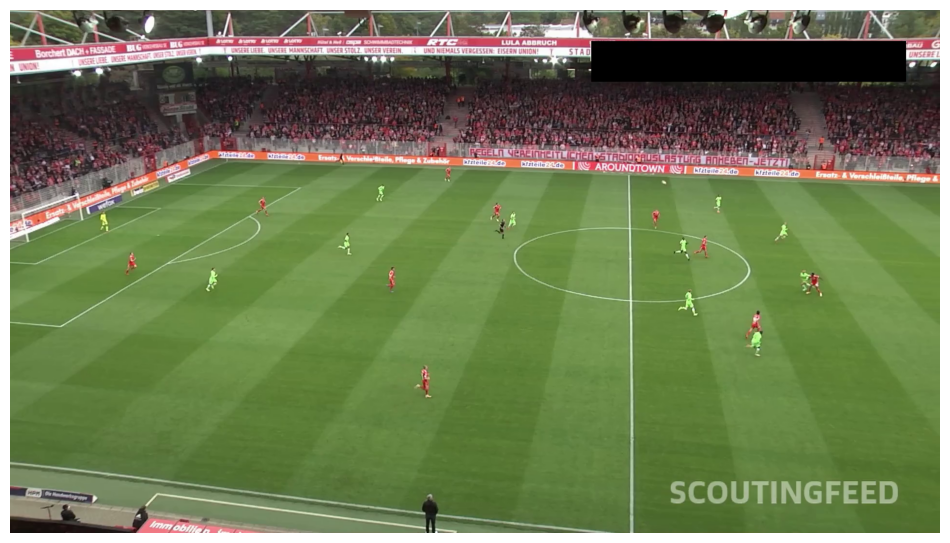

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

sv.plot_image(frame)

## Basic Annotation using Supervision and Pre-Trained model

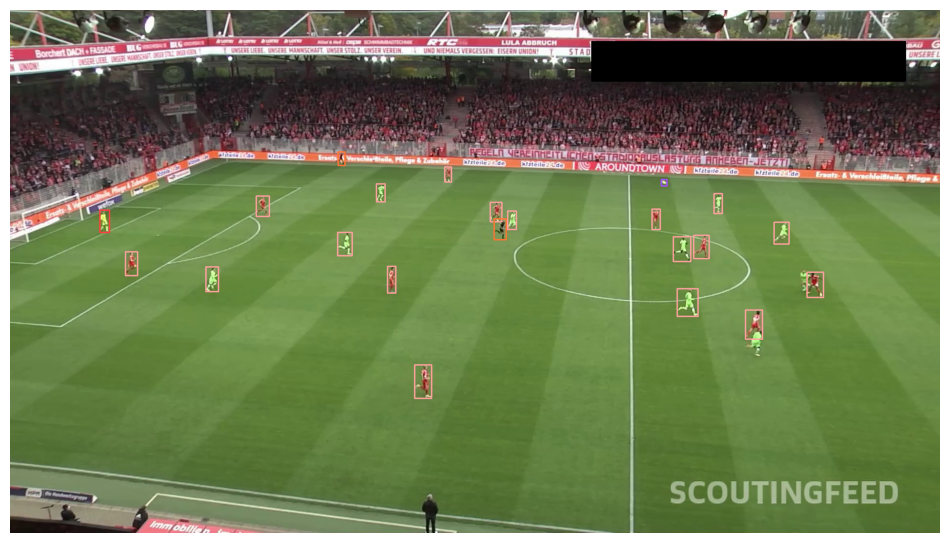

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"

box_annotator = sv.BoxAnnotator() # Initialize a BoxAnnotator object for drawing bounding boxes

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH) # Create a generator to yield frames from the video
frame = next(frame_generator) # Get the first frame from the generator

# Perform inference on the frame using the pre-trained player detection model
result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
# Convert the inference result to a supervision Detections object
detections = sv.Detections.from_inference(result)

annotated_frame = frame.copy() # Create a copy of the original frame to draw on
# Annotate the frame with bounding boxes based on the detections
annotated_frame = box_annotator.annotate(annotated_frame, detections)

sv.plot_image(annotated_frame)

# Unique colored boxes for different classes and the class names

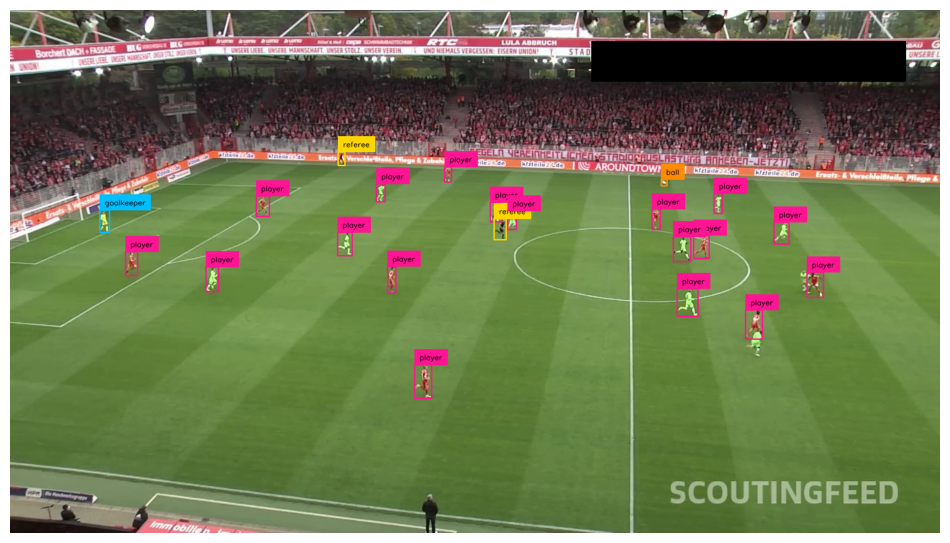

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"

box_annotator = sv.BoxAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)

label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000')
)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(annotated_frame, detections)
annotated_frame = label_annotator.annotate(annotated_frame, detections)

sv.plot_image(annotated_frame)

## Class names and boxes, but with their Confidence Scores included too

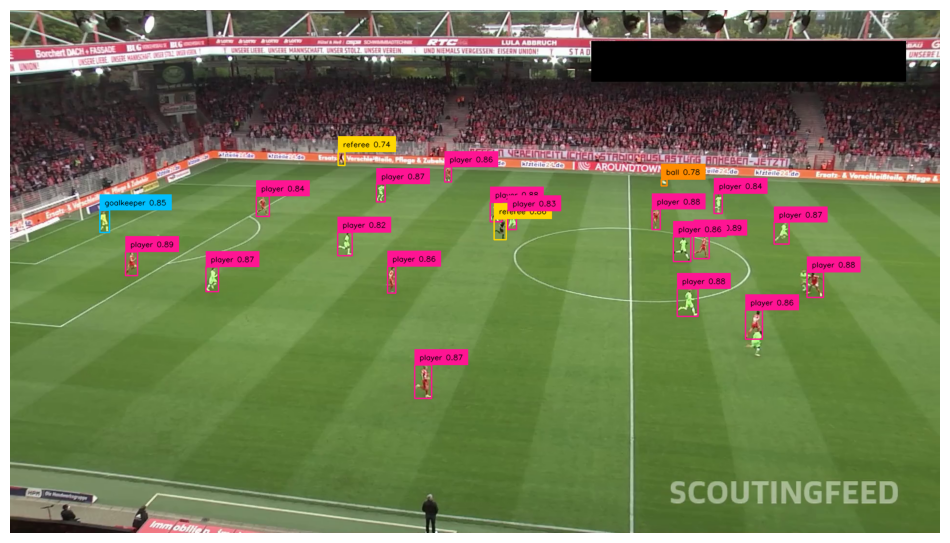

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"

# Initialize BoxAnnotator with a custom color palette and thickness
box_annotator = sv.BoxAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']), # Define colors for bounding boxes
    thickness=2 # Set the thickness of the bounding boxes
)

# Initialize LabelAnnotator with the same custom color palette and text color
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']), # Define colors for labels
    text_color=sv.Color.from_hex('#000000') # Set the text color for labels
)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH) # Create a generator to yield frames from the video
frame = next(frame_generator) # Get the first frame from the generator

# Perform inference on the frame using the pre-trained player detection model
result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
# Convert the inference result to a supervision Detections object
detections = sv.Detections.from_inference(result)

# Create labels for each detection including class name and confidence score
labels = [
    f"{class_name} {confidence:.2f}" # Format the label string
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence) # Iterate through class names and confidence scores
]

annotated_frame = frame.copy() # Create a copy of the original frame to draw on
# Annotate the frame with bounding boxes
annotated_frame = box_annotator.annotate(annotated_frame, detections)
# Annotate the frame with labels (including confidence scores)
annotated_frame = label_annotator.annotate(annotated_frame, detections, labels)

sv.plot_image(annotated_frame)

## Moving to processing of a Single Frame to a Whole Video

In [ ]:
from tqdm import tqdm
import supervision as sv

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"
TARGET_VIDEO_PATH = "/content/121364_0_result_1.mp4"

box_annotator = sv.BoxAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)

label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000')
)

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
video_sink = sv.VideoSink(TARGET_VIDEO_PATH, video_info=video_info)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

with video_sink:
    for frame in tqdm(frame_generator, total=video_info.total_frames):

        result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
        detections = sv.Detections.from_inference(result)

        labels = [
            f"{class_name} {confidence:.2f}"
            for class_name, confidence
            in zip(detections['class_name'], detections.confidence)
        ]

        annotated_frame = frame.copy()
        annotated_frame = box_annotator.annotate(annotated_frame, detections)
        annotated_frame = label_annotator.annotate(annotated_frame, detections, labels)

        video_sink.write_frame(annotated_frame)

100%|██████████| 750/750 [02:14<00:00,  5.57it/s]


# video game style visualization

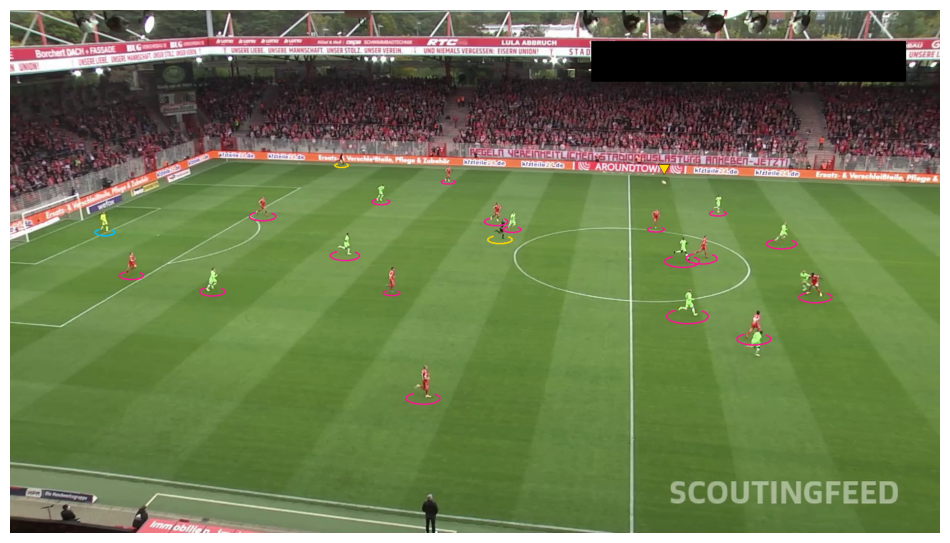

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"
BALL_ID = 0 # Define the class ID for the ball

# Initialize EllipseAnnotator with a custom color palette and thickness
ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']), # Define colors for ellipses
    thickness=2 # Set the thickness of the ellipses
)

# label_annotator = sv.LabelAnnotator(
#     color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
#     text_color=sv.Color.from_hex('#000000')
# ) # This label annotator is commented out and not used in this cell

# Initialize TriangleAnnotator with a custom color, base, height, and outline thickness
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'), # Define the color for the triangle
    base=25, # Set the base size of the triangle
    height=21, # Set the height of the triangle
    outline_thickness=1 # Set the outline thickness of the triangle
)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH) # Create a generator to yield frames from the video
frame = next(frame_generator) # Get the first frame from the generator

# Perform inference on the frame using the pre-trained player detection model
result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
# Convert the inference result to a supervision Detections object
detections = sv.Detections.from_inference(result)

# Filter detections to get only the ball detections
ball_detections = detections[detections.class_id == BALL_ID]
# Pad the bounding boxes of the ball detections by 10 pixels
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

# Filter detections to get all detections except the ball
all_detections = detections[detections.class_id != BALL_ID]
# Apply Non-Maximum Suppression (NMS) to the non-ball detections
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
# Adjust the class IDs of the non-ball detections (assuming ball was class 0)
all_detections.class_id -= 1

# labels = [
#     f"{class_name} {confidence:.2f}"
#     for class_name, confidence
#     in zip(detections['class_name'], detections.confidence)
# ] # This label creation is commented out and not used in this cell

annotated_frame = frame.copy() # Create a copy of the original frame to draw on
# Annotate the non-ball detections with ellipses
annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=all_detections)
# Annotate the ball detections with triangles
annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)

sv.plot_image(annotated_frame)

# Video

In [ ]:
from tqdm import tqdm
import supervision as sv

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"
TARGET_VIDEO_PATH = "/content/121364_0_result_2.mp4"
BALL_ID = 0

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']), # Define colors for ellipses
    thickness=2 # Set the thickness of the ellipses
)

triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'), # Define the color for the triangle
    base=25, # Set the base size of the triangle
    height=21, # Set the height of the triangle
    outline_thickness=1 # Set the outline thickness of the triangle
)

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
video_sink = sv.VideoSink(TARGET_VIDEO_PATH, video_info=video_info)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

with video_sink:
    for frame in tqdm(frame_generator, total=video_info.total_frames):

        result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
        detections = sv.Detections.from_inference(result)

        ball_detections = detections[detections.class_id == BALL_ID]
        ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

        all_detections = detections[detections.class_id != BALL_ID]
        all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
        all_detections.class_id -= 1

        annotated_frame = frame.copy()
        annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=all_detections)
        annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)

        video_sink.write_frame(annotated_frame)

100%|██████████| 750/750 [01:54<00:00,  6.55it/s]


# Player Tracking

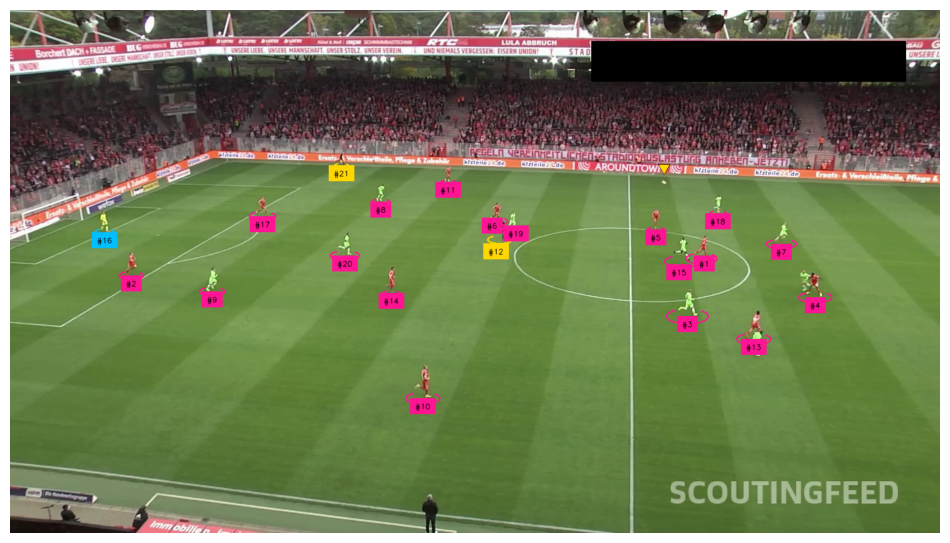

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"
BALL_ID = 0 # Define the class ID for the ball

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']), # Define colors for ellipses (for players)
    thickness=2
)

# Initialize LabelAnnotator for displaying tracker IDs
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']), # Define colors for labels (should match ellipse colors for consistency)
    text_color=sv.Color.from_hex('#000000'), # Set the text color for labels (black)
    text_position=sv.Position.BOTTOM_CENTER, # Position the label at the bottom center of the bounding box
    smart_position=True # Enable smart positioning to avoid label overlaps
)

# Initialize TriangleAnnotator for the ball
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'), # Define the color for the triangle (for the ball)
    base=25, # Set the base size of the triangle
    height=21, # Set the height of the triangle
    outline_thickness=1 # Set the outline thickness of the triangle
)

tracker = sv.ByteTrack() # Initialize a ByteTrack object for object tracking
tracker.reset() # Reset the tracker's state for a new video sequence

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH) # Create a generator to yield frames from the video
frame = next(frame_generator) # Get the first frame from the generator

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
# Convert the inference result to a supervision Detections object
detections = sv.Detections.from_inference(result)

# Filter detections to get only the ball detections
ball_detections = detections[detections.class_id == BALL_ID]
# Pad the bounding boxes of the ball detections by 10 pixels (to make them slightly larger)
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

# Filter detections to get all detections except the ball (these are the players)
all_detections = detections[detections.class_id != BALL_ID]
# Apply Non-Maximum Suppression (NMS) to the non-ball detections to remove overlapping boxes
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
# Adjust the class IDs of the non-ball detections (assuming ball was class 0, so subsequent classes are shifted)
all_detections.class_id = all_detections.class_id - 1
# Update the tracker with the current frame's non-ball detections to assign tracker IDs
all_detections = tracker.update_with_detections(detections=all_detections)

# Create labels for each tracked object using their assigned tracker ID
labels = [
    f"#{tracker_id}" # Format the label string with '#' and the tracker ID
    for tracker_id
    in all_detections.tracker_id # Iterate through the tracker IDs of the tracked objects
]

annotated_frame = frame.copy() # Create a copy of the original frame to draw on
# Annotate the non-ball detections (players) with ellipses
annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=all_detections)
# Annotate the ball detections with triangles
annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)
# Annotate the non-ball detections with their tracker ID labels
annotated_frame = label_annotator.annotate(annotated_frame, all_detections, labels)

sv.plot_image(annotated_frame)

# Video

In [ ]:
from tqdm import tqdm
import supervision as sv

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"
TARGET_VIDEO_PATH = "/content/121364_0_result_3.mp4"
BALL_ID = 0


ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)

label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER,
    smart_position=True
)

triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
video_sink = sv.VideoSink(TARGET_VIDEO_PATH, video_info=video_info)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

with video_sink:
    for frame in tqdm(frame_generator, total=video_info.total_frames):

        result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
        detections = sv.Detections.from_inference(result)

        ball_detections = detections[detections.class_id == BALL_ID]
        ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

        all_detections = detections[detections.class_id != BALL_ID]
        all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
        all_detections.class_id -= 1
        all_detections = tracker.update_with_detections(detections=all_detections)

        labels = [
            f"#{tracker_id}"
            for tracker_id
            in all_detections.tracker_id
        ]

        annotated_frame = frame.copy()
        annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=all_detections)
        annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)
        annotated_frame = label_annotator.annotate(annotated_frame, all_detections, labels)

        video_sink.write_frame(annotated_frame)

100%|██████████| 750/750 [01:59<00:00,  6.27it/s]


## split players into teams

![football AI diagram](https://media.roboflow.com/notebooks/examples/football-ai-team-clustering.png)

**Note:** Before training our player clustering model, we need to gather training data. To do this, we'll sample one frame per second, detect players within those frames, and then crop them out.

In [ ]:
from tqdm import tqdm

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"
PLAYER_ID = 2
STRIDE = 30

def extract_crops(SOURCE_VIDEO_PATH):
  frame_generator = sv.get_video_frames_generator(
      source_path=SOURCE_VIDEO_PATH,
      stride=STRIDE)

  crops = []
  for frame in tqdm(frame_generator, desc='collecting crops'):
      result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
      detections = sv.Detections.from_inference(result)
      detections = detections.with_nms(threshold=0.5, class_agnostic=True)
      detections = detections[detections.class_id == PLAYER_ID]
      crops += [
          sv.crop_image(frame, xyxy)
          for xyxy
          in detections.xyxy
      ]

  return crops

In [ ]:
crops = extract_crops(SOURCE_VIDEO_PATH)

collecting crops: 25it [00:09,  2.63it/s]


In [ ]:
len(crops)

479

**Note:** Here's a sample (100 elements) of the crops we've gathered.

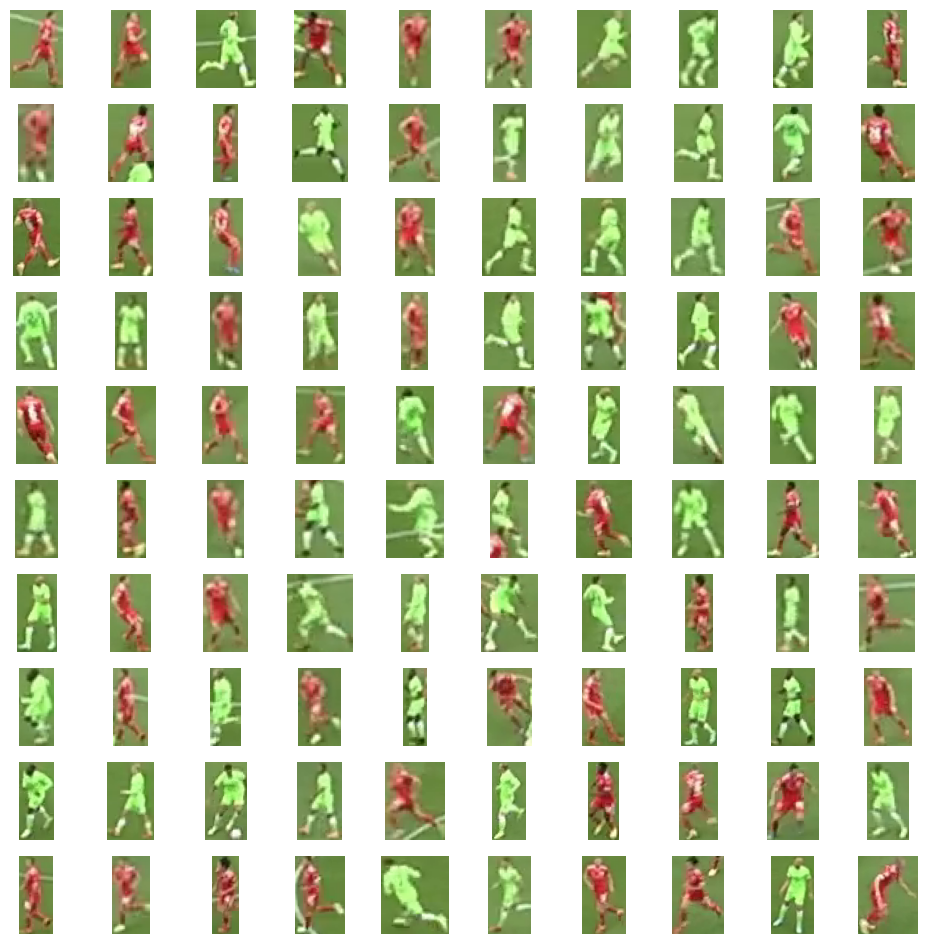

In [ ]:
sv.plot_images_grid(crops[:100], grid_size=(10, 10))

In [ ]:
import torch
from transformers import AutoProcessor, SiglipVisionModel, SiglipVisionConfig

SIGLIP_MODEL_PATH = "google/siglip-base-patch16-224"

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
EMBEDDINGS_MODEL = SiglipVisionModel.from_pretrained(SIGLIP_MODEL_PATH).to(DEVICE)
EMBEDDINGS_PROCESSOR = AutoProcessor.from_pretrained(SIGLIP_MODEL_PATH)

config.json:   0%|          | 0.00/432 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/813M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/368 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/711 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/798k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/409 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

## Convert the crops from OpenCV format to Pillow format, as Supervision runs on OpenCV internally but SigLIP expects the crops to be in Pillow

In [ ]:
import numpy as np
from more_itertools import chunked

BATCH_SIZE = 32

crops = [sv.cv2_to_pillow(crop) for crop in crops]
batches = chunked(crops, BATCH_SIZE)
data = []
with torch.no_grad():
    for batch in tqdm(batches, desc='embedding extraction'):
        inputs = EMBEDDINGS_PROCESSOR(images=batch, return_tensors="pt").to(DEVICE)
        outputs = EMBEDDINGS_MODEL(**inputs)
        embeddings = torch.mean(outputs.last_hidden_state, dim=1).cpu().numpy()
        data.append(embeddings)

data = np.concatenate(data)

embedding extraction: 15it [00:06,  2.49it/s]


In [ ]:
data.shape

(479, 768)

In [ ]:
import umap
from sklearn.cluster import KMeans

REDUCER = umap.UMAP(n_components=3)
CLUSTERING_MODEL = KMeans(n_clusters=2)

In [ ]:
projections = REDUCER.fit_transform(data)

In [ ]:
projections.shape

(479, 3)

In [ ]:
clusters = CLUSTERING_MODEL.fit_predict(projections)

In [ ]:
clusters[:10]

array([0, 0, 1, 0, 0, 0, 1, 1, 1, 0], dtype=int32)

In [ ]:
team_0 = [
    crop # Select the individual crop
    for crop, cluster
    in zip(crops, clusters)
    if cluster == 0
]

## Detected the players of 1 team

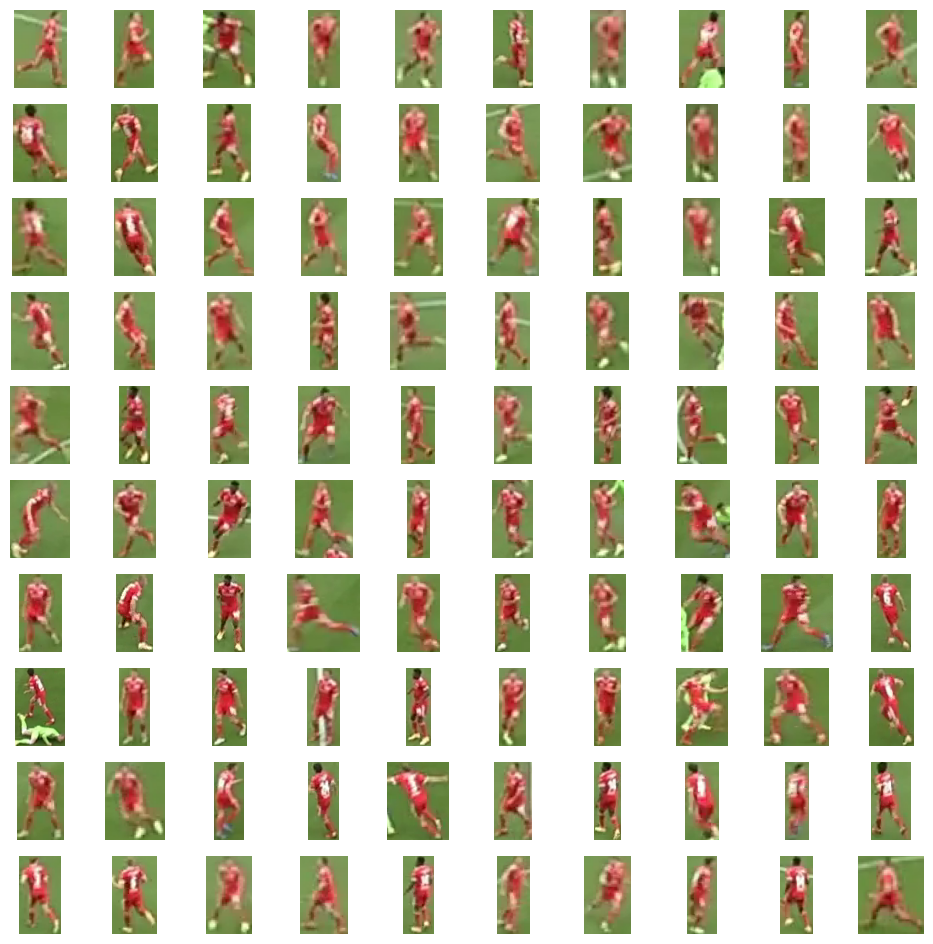

In [ ]:
sv.plot_images_grid(team_0[:100], grid_size=(10, 10))

## Sorted the players in 2 teams

collecting crops: 25it [00:18,  1.32it/s]
Embedding extraction: 15it [00:09,  1.62it/s]
Embedding extraction: 1it [00:00,  3.25it/s]


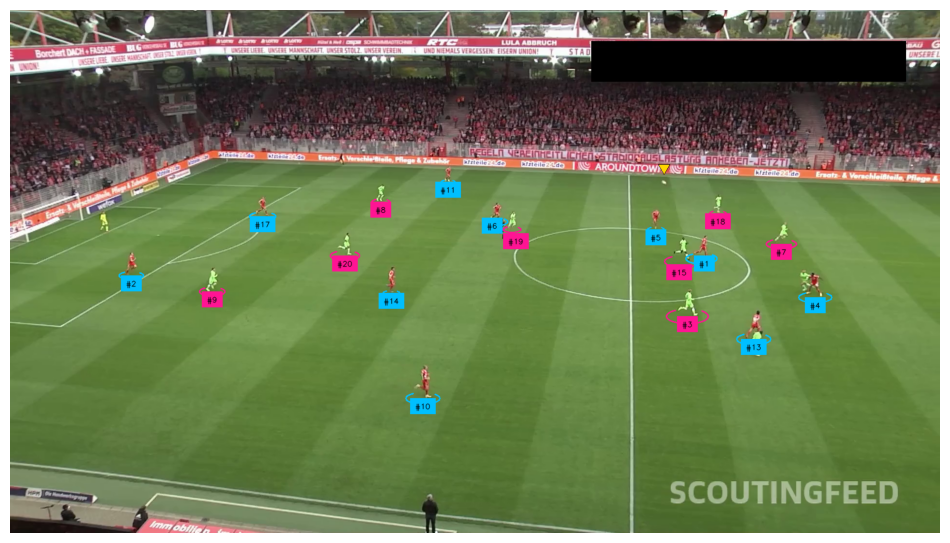

In [ ]:
import supervision as sv
from sports.common.team import TeamClassifier

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"
BALL_ID = 0
PLAYER_ID = 2

crops = extract_crops(SOURCE_VIDEO_PATH)
team_classifier = TeamClassifier(device=DEVICE)
team_classifier.fit(crops)

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)

label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER,
    smart_position=True
)

triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

player_detections = all_detections[all_detections.class_id == PLAYER_ID]
player_crops = [sv.crop_image(frame, xyxy) for xyxy in player_detections.xyxy]
player_detections.class_id = team_classifier.predict(player_crops)

labels = [
    f"#{tracker_id}"
    for tracker_id
    in player_detections.tracker_id
]

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=player_detections)
annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)
annotated_frame = label_annotator.annotate(annotated_frame, player_detections, labels)

sv.plot_image(annotated_frame)

# Video

In [ ]:
from tqdm import tqdm
import supervision as sv
from sports.common.team import TeamClassifier

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"
TARGET_VIDEO_PATH = "/content/121364_0_result_4.mp4"
BALL_ID = 0
PLAYER_ID = 2

crops = extract_crops(SOURCE_VIDEO_PATH)
team_classifier = TeamClassifier(device=DEVICE)
team_classifier.fit(crops)

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)

label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER,
    smart_position=True
)

triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
video_sink = sv.VideoSink(TARGET_VIDEO_PATH, video_info=video_info)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

with video_sink:
    for frame in tqdm(frame_generator, total=video_info.total_frames):

        result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
        detections = sv.Detections.from_inference(result)

        ball_detections = detections[detections.class_id == BALL_ID]
        ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

        all_detections = detections[detections.class_id != BALL_ID]
        all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
        all_detections = tracker.update_with_detections(detections=all_detections)

        player_detections = all_detections[all_detections.class_id == PLAYER_ID]
        player_crops = [sv.crop_image(frame, xyxy) for xyxy in player_detections.xyxy]
        player_detections.class_id = team_classifier.predict(player_crops)

        labels = [
            f"#{tracker_id}"
            for tracker_id
            in player_detections.tracker_id
        ]

        annotated_frame = frame.copy()
        annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=player_detections)
        annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)
        annotated_frame = label_annotator.annotate(annotated_frame, player_detections, labels)

        video_sink.write_frame(annotated_frame)


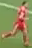
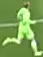
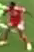
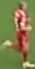
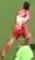
...
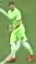
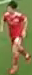
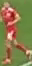
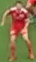
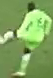

In [ ]:
import plotly.graph_objects as go
import numpy as np
from typing import Dict, List
from IPython.core.display import display, HTML
from PIL import Image
import base64
from io import BytesIO
import supervision as sv


def pil_image_to_data_uri(image: Image.Image) -> str:
    buffered = BytesIO()
    image.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode("utf-8")
    return f"data:image/png;base64,{img_str}"


def display_projections(
    labels: np.ndarray,
    projections: np.ndarray,
    images: List[Image.Image],
    show_legend: bool = False,
    show_markers_with_text: bool = True
) -> None:
    image_data_uris = {f"image_{i}": pil_image_to_data_uri(image) for i, image in enumerate(images)}
    image_ids = np.array([f"image_{i}" for i in range(len(images))])

    unique_labels = np.unique(labels)
    traces = []
    for unique_label in unique_labels:
        mask = labels == unique_label
        customdata_masked = image_ids[mask]
        trace = go.Scatter3d(
            x=projections[mask][:, 0],
            y=projections[mask][:, 1],
            z=projections[mask][:, 2],
            mode='markers+text' if show_markers_with_text else 'markers',
            text=labels[mask],
            customdata=customdata_masked,
            name=str(unique_label),
            marker=dict(size=8),
            hovertemplate="<b>class: %{text}</b><br>image ID: %{customdata}<extra></extra>"
        )
        traces.append(trace)

    # Calculate shared range for cube appearance
    all_axes = projections
    min_val = np.min(all_axes)
    max_val = np.max(all_axes)
    padding = (max_val - min_val) * 0.05
    axis_range = [min_val - padding, max_val + padding]

    fig = go.Figure(data=traces)
    fig.update_layout(
        scene=dict(
            xaxis=dict(title='X', range=axis_range),
            yaxis=dict(title='Y', range=axis_range),
            zaxis=dict(title='Z', range=axis_range),
            aspectmode='cube'  # Ensures equal scaling
        ),
        width=1000,
        height=1000,
        showlegend=show_legend
    )

    plotly_div = fig.to_html(full_html=False, include_plotlyjs=False, div_id="scatter-plot-3d")

    javascript_code = f"""
    <script>
        function displayImage(imageId) {{
            var imageElement = document.getElementById('image-display');
            var placeholderText = document.getElementById('placeholder-text');
            var imageDataURIs = {image_data_uris};
            imageElement.src = imageDataURIs[imageId];
            imageElement.style.display = 'block';
            placeholderText.style.display = 'none';
        }}

        var chartElement = document.getElementById('scatter-plot-3d');

        chartElement.on('plotly_click', function(data) {{
            var customdata = data.points[0].customdata;
            displayImage(customdata);
        }});
    </script>
    """

    html_template = f"""
    <!DOCTYPE html>
    <html>
        <head>
            <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
            <style>
                #image-container {{
                    position: fixed;
                    top: 0;
                    left: 0;
                    width: 200px;
                    height: 200px;
                    padding: 5px;
                    border: 1px solid #ccc;
                    background-color: white;
                    z-index: 1000;
                    box-sizing: border-box;
                    display: flex;
                    align-items: center;
                    justify-content: center;
                    text-align: center;
                }}
                #image-display {{
                    width: 100%;
                    height: 100%;
                    object-fit: contain;
                }}
            </style>
        </head>
        <body>
            {plotly_div}
            <div id="image-container">
                <img id="image-display" src="" alt="Selected image" style="display: none;" />
                <p id="placeholder-text">Click on a data entry to display an image</p>
            </div>
            {javascript_code}
        </body>
    </html>
    """
    display(HTML(html_template))

crops_pil = [sv.cv2_to_pillow(crop) for crop in crops]
display_projections(clusters, projections, crops_pil)

**Note:** Time to assign goalkeepers to teams. We'll use a simple heuristic: calculate the average position (centroid) of the players belonging to both teams and then assign the goalkeeper to the team whose average position is closer.

## assign goalkeepers to teams

In [ ]:
import numpy as np
import supervision as sv

def resolve_goalkeepers_team_id(
    players: sv.Detections,
    goalkeepers: sv.Detections
) -> np.ndarray:
    goalkeepers_xy = goalkeepers.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    players_xy = players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    team_0_centroid = players_xy[players.class_id == 0].mean(axis=0)
    team_1_centroid = players_xy[players.class_id == 1].mean(axis=0)
    goalkeepers_team_id = []
    for goalkeeper_xy in goalkeepers_xy:
        dist_0 = np.linalg.norm(goalkeeper_xy - team_0_centroid)
        dist_1 = np.linalg.norm(goalkeeper_xy - team_1_centroid)
        goalkeepers_team_id.append(0 if dist_0 < dist_1 else 1)

    return np.array(goalkeepers_team_id)

collecting crops: 25it [00:16,  1.50it/s]
Embedding extraction: 15it [00:06,  2.39it/s]
Embedding extraction: 1it [00:00,  4.15it/s]


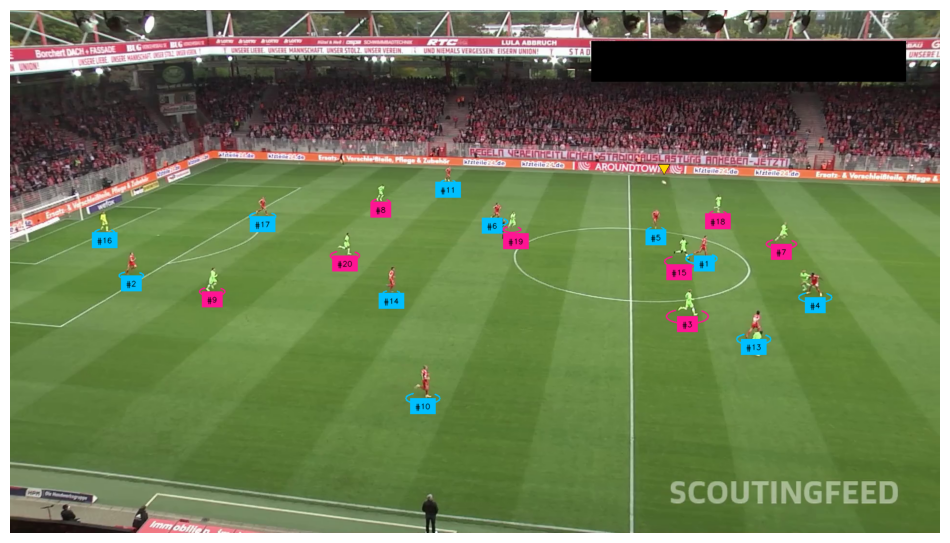

In [ ]:
import supervision as sv
from sports.common.team import TeamClassifier

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2

crops = extract_crops(SOURCE_VIDEO_PATH)
team_classifier = TeamClassifier(device=DEVICE)
team_classifier.fit(crops)

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)

label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER,
    smart_position=True
)

triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

player_detections = all_detections[all_detections.class_id == PLAYER_ID]
goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]

player_crops = [sv.crop_image(frame, xyxy) for xyxy in player_detections.xyxy]
player_detections.class_id = team_classifier.predict(player_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    player_detections, goalkeepers_detections
)

all_detections = sv.Detections.merge([player_detections, goalkeepers_detections])

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=all_detections)
annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)
annotated_frame = label_annotator.annotate(annotated_frame, all_detections, labels)

sv.plot_image(annotated_frame)

## Visualize the Refrees

collecting crops: 25it [00:08,  2.93it/s]
Embedding extraction: 15it [00:06,  2.39it/s]
Embedding extraction: 1it [00:00,  4.25it/s]


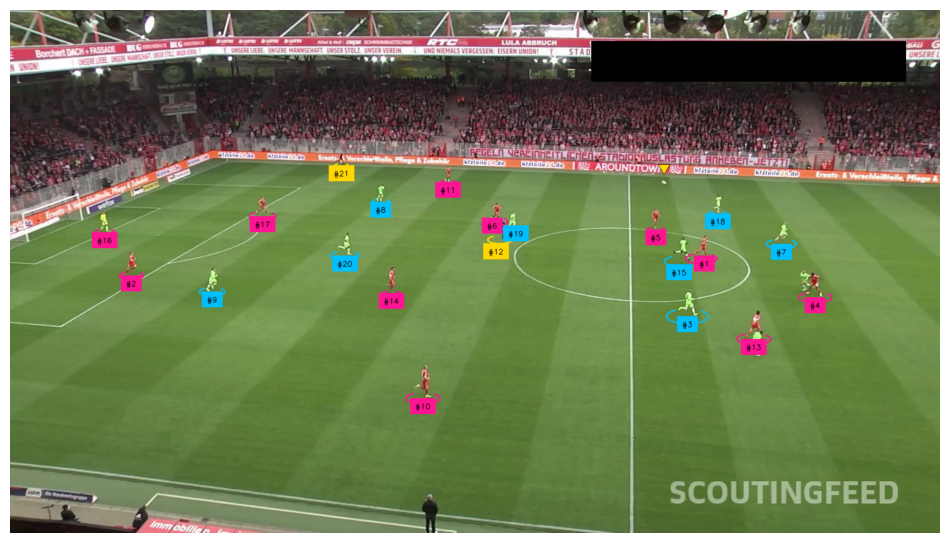

In [ ]:
import supervision as sv
from sports.common.team import TeamClassifier

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFREE_ID = 3

crops = extract_crops(SOURCE_VIDEO_PATH)
team_classifier = TeamClassifier(device=DEVICE)
team_classifier.fit(crops)

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)

label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER,
    smart_position=True
)

triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

player_detections = all_detections[all_detections.class_id == PLAYER_ID]
goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
refree_detections = all_detections[all_detections.class_id == REFREE_ID]

player_crops = [sv.crop_image(frame, xyxy) for xyxy in player_detections.xyxy]
player_detections.class_id = team_classifier.predict(player_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    player_detections, goalkeepers_detections
)

refree_detections.class_id -= 1

all_detections = sv.Detections.merge([player_detections, goalkeepers_detections, refree_detections])

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=all_detections)
annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)
annotated_frame = label_annotator.annotate(annotated_frame, all_detections, labels)

sv.plot_image(annotated_frame)

## Frame to Video

In [ ]:
from tqdm import tqdm
import supervision as sv
from sports.common.team import TeamClassifier

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"
TARGET_VIDEO_PATH = "/content/121364_0_result_5.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFREE_ID = 3

crops = extract_crops(SOURCE_VIDEO_PATH)
team_classifier = TeamClassifier(device=DEVICE)
team_classifier.fit(crops)

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)

label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER,
    smart_position=True
)

triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
video_sink = sv.VideoSink(TARGET_VIDEO_PATH, video_info=video_info)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

with video_sink:
    for frame in tqdm(frame_generator, total=video_info.total_frames):

        result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
        detections = sv.Detections.from_inference(result)

        ball_detections = detections[detections.class_id == BALL_ID]
        ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

        all_detections = detections[detections.class_id != BALL_ID]
        all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
        all_detections = tracker.update_with_detections(detections=all_detections)

        player_detections = all_detections[all_detections.class_id == PLAYER_ID]
        goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
        refree_detections = all_detections[all_detections.class_id == REFREE_ID]

        player_crops = [sv.crop_image(frame, xyxy) for xyxy in player_detections.xyxy]
        player_detections.class_id = team_classifier.predict(player_crops).astype(int)

        goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
            player_detections, goalkeepers_detections
        ).astype(int)

        refree_detections.class_id = (refree_detections.class_id - 1).astype(int)

        all_detections = sv.Detections.merge([player_detections, goalkeepers_detections, refree_detections])

        labels = [
            f"#{tracker_id}"
            for tracker_id
            in all_detections.tracker_id
        ]

        annotated_frame = frame.copy()
        annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=all_detections)
        annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)
        annotated_frame = label_annotator.annotate(annotated_frame, all_detections, labels)

        video_sink.write_frame(annotated_frame)

# **pitch keypoint detection**

In [ ]:
from inference import get_model
from google.colab import userdata

ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API_KEY')
PITCH_DETECTION_MODEL_ID = "football-field-detection-f07vi-pjo7k/1"
PITCH_DETECTION_MODEL = get_model(model_id=PITCH_DETECTION_MODEL_ID, api_key=ROBOFLOW_API_KEY)

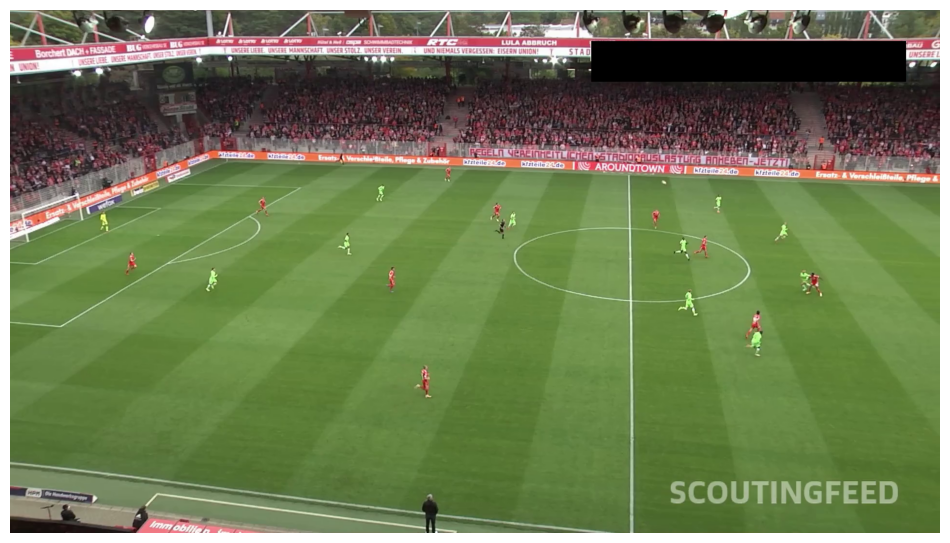

In [ ]:
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

sv.plot_image(frame)

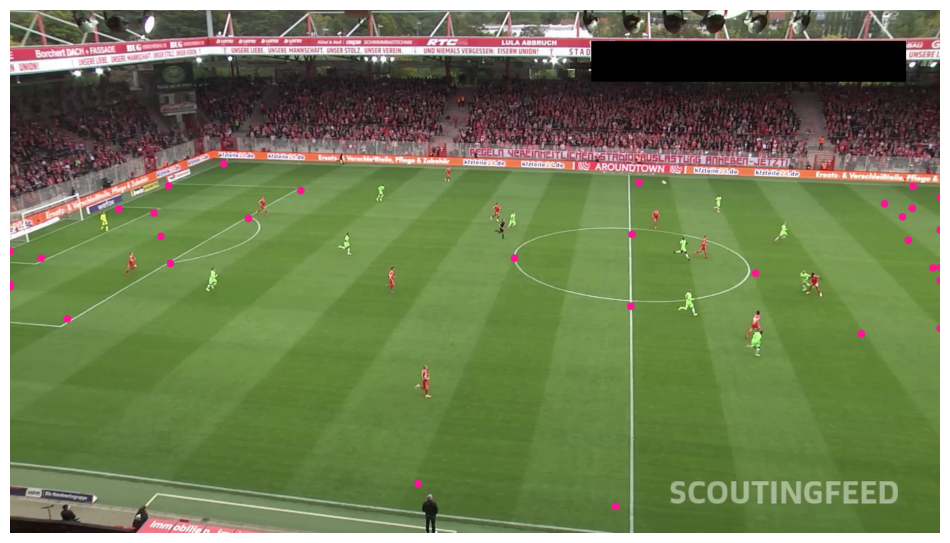

In [ ]:
vertex_annotator = sv.VertexAnnotator(
    color = sv.Color.from_hex('#FF1493'),
    radius=8
)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PITCH_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(scene=annotated_frame,
                                            key_points=key_points)

sv.plot_image(annotated_frame)

**Note:** Notice that some of the keypoints we detected are in incorrect locations. These are keypoints with a low confidence level. Let's filter out these keypoints and keep only the ones the model is confident about.

# filter low confidence keypoints

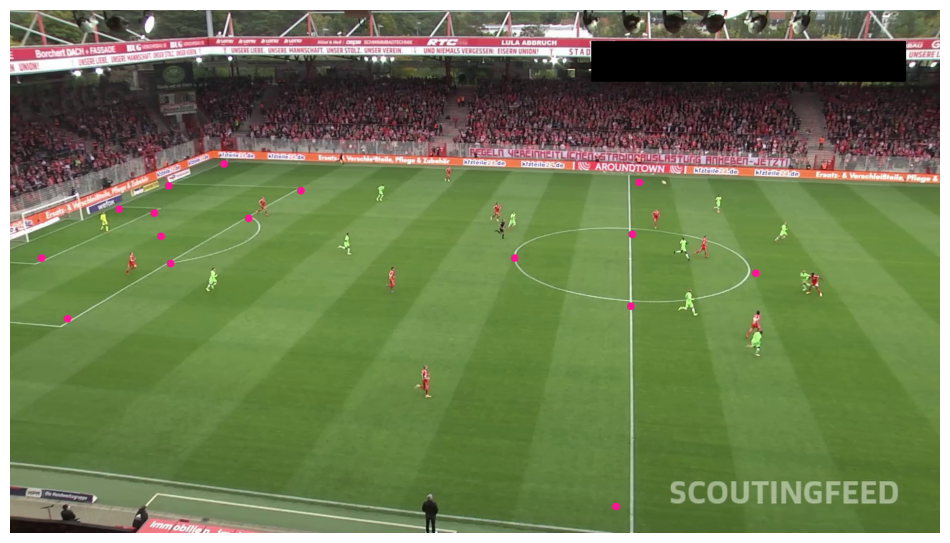

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"

vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PITCH_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_reference_key_points)

sv.plot_image(annotated_frame)

In [ ]:
key_points.confidence[0]

array([9.3876809e-01, 8.9127934e-01, 7.8391296e-01, 2.2790587e-01,
       3.3442020e-02, 6.3273907e-03, 8.6863089e-01, 5.0178045e-01,
       8.5960132e-01, 9.8540342e-01, 9.7254670e-01, 9.0391123e-01,
       5.9463745e-01, 9.8397148e-01, 9.8855865e-01, 9.9169648e-01,
       7.1565992e-01, 4.9824953e-02, 2.0480812e-02, 4.6679378e-03,
       1.2294650e-03, 4.5354962e-03, 5.3488612e-03, 9.2339516e-04,
       1.2227237e-02, 6.3397288e-03, 3.5541654e-03, 6.4164400e-04,
       1.5556812e-04, 4.0084124e-04, 9.9861944e-01, 8.3546245e-01],
      dtype=float32)

# project pitch lines on frame

**Note:** The [sports](https://github.com/roboflow/sports) repository contains a [`SoccerPitchConfiguration`](https://github.com/roboflow/sports/blob/06053616f1f8a8ae1fa936eb00dcdc2e4f888bb1/sports/configs/soccer.py#L6) that provides information about the real-world geometry of the soccer pitch. It also includes utilities for visualizing elements located on the pitch.

In [ ]:
from sports.configs.soccer import SoccerPitchConfiguration

CONFIG = SoccerPitchConfiguration()

In [ ]:
CONFIG.vertices

[(0, 0),
 (0, 1450.0),
 (0, 2584.0),
 (0, 4416.0),
 (0, 5550.0),
 (0, 7000),
 (550, 2584.0),
 (550, 4416.0),
 (1100, 3500.0),
 (2015, 1450.0),
 (2015, 2584.0),
 (2015, 4416.0),
 (2015, 5550.0),
 (6000.0, 0),
 (6000.0, 2585.0),
 (6000.0, 4415.0),
 (6000.0, 7000),
 (9985, 1450.0),
 (9985, 2584.0),
 (9985, 4416.0),
 (9985, 5550.0),
 (10900, 3500.0),
 (11450, 2584.0),
 (11450, 4416.0),
 (12000, 0),
 (12000, 1450.0),
 (12000, 2584.0),
 (12000, 4416.0),
 (12000, 5550.0),
 (12000, 7000),
 (5085.0, 3500.0),
 (6915.0, 3500.0)]

In [ ]:
CONFIG.edges

[(1, 2),
 (2, 3),
 (3, 4),
 (4, 5),
 (5, 6),
 (7, 8),
 (10, 11),
 (11, 12),
 (12, 13),
 (14, 15),
 (15, 16),
 (16, 17),
 (18, 19),
 (19, 20),
 (20, 21),
 (23, 24),
 (25, 26),
 (26, 27),
 (27, 28),
 (28, 29),
 (29, 30),
 (1, 14),
 (2, 10),
 (3, 7),
 (4, 8),
 (5, 13),
 (6, 17),
 (14, 25),
 (18, 26),
 (23, 27),
 (24, 28),
 (21, 29),
 (17, 30)]

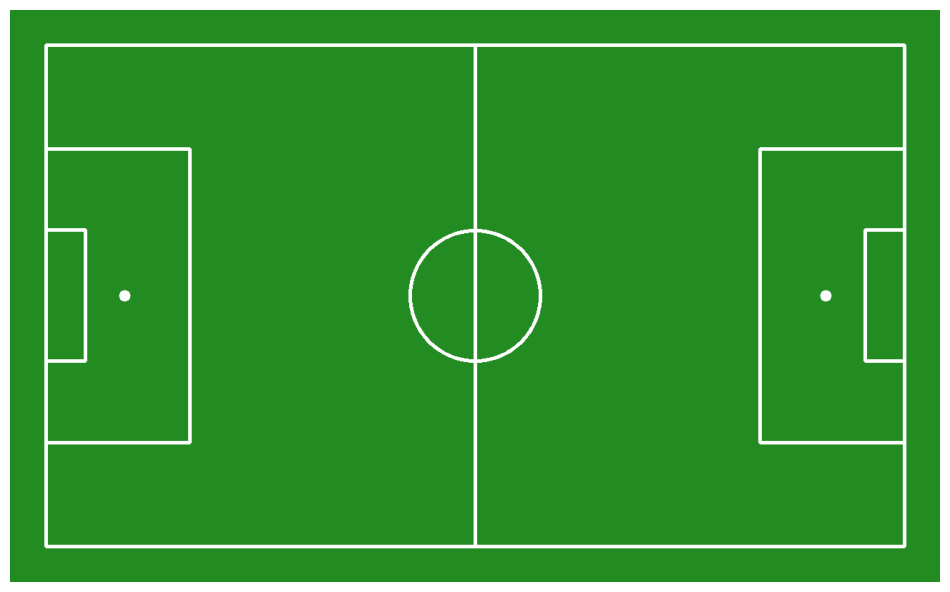

In [ ]:
from sports.annotators.soccer import draw_pitch

annotated_frame = draw_pitch(CONFIG)

sv.plot_image(annotated_frame)

**Note:** It's time to utilize the keypoint pairs located on the camera perspective plane and the football pitch plane. The [sports](https://github.com/roboflow/sports) repository includes a [`ViewTransformer`](https://github.com/roboflow/sports/blob/06053616f1f8a8ae1fa936eb00dcdc2e4f888bb1/sports/common/view.py#L7), which employs homography for perspective transformation.

In [ ]:
import cv2

class ViewTransformer:
  def __init__(self, source: np.ndarray, target: np.ndarray):
    source = source.astype(np.float32)
    target = target.astype(np.float32)
    self.m, _ = cv2.findHomography(source, target)

  def transform_points(self, points: np.ndarray) -> np.ndarray:
    if points.shape[0] == 0:  # Handle empty input points
      return np.empty((0, 2), dtype=np.float32)

    points = points.reshape(-1, 1, 2).astype(np.float32)
    points = cv2.perspectiveTransform(points, self.m)

    if points is None:
        return np.empty((0, 2), dtype=np.float32)

    return points.reshape(-1, 2).astype(np.float32)

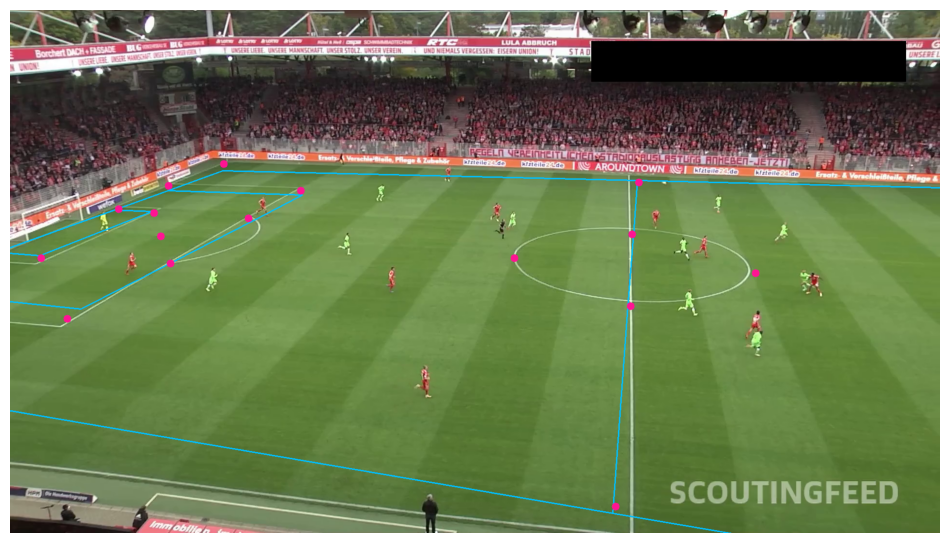

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"

vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)

edge_annotator = sv.EdgeAnnotator(
    color = sv.Color.from_hex('00BFFF'),
    thickness = 2,
    edges = CONFIG.edges
)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PITCH_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

pitch_reference_points = np.array(CONFIG.vertices)[filter]


view_transformer = ViewTransformer(
    source = pitch_reference_points,
    target = frame_reference_points
)

pitch_all_points = np.array(CONFIG.vertices)
frame_all_points = view_transformer.transform_points(pitch_all_points)
frame_all_key_points = sv.KeyPoints(xy=frame_all_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = edge_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_all_key_points
)
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_reference_key_points)

sv.plot_image(annotated_frame)

## Transform points from Camera view into Pitch perspective (this is the opposite of what I did above)

collecting crops: 25it [00:09,  2.60it/s]
Embedding extraction: 15it [00:06,  2.37it/s]
Embedding extraction: 1it [00:00,  3.77it/s]


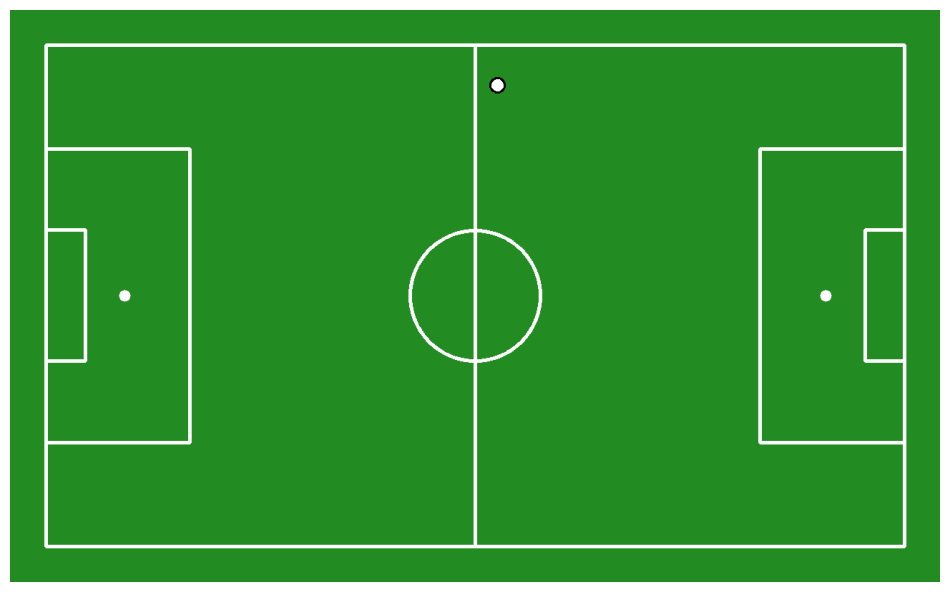

In [ ]:
import supervision as sv
from sports.common.team import TeamClassifier
from sports.annotators.soccer import draw_pitch, draw_points_on_pitch

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFREE_ID = 3

crops = extract_crops(SOURCE_VIDEO_PATH)
team_classifier = TeamClassifier(device=DEVICE)
team_classifier.fit(crops)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

player_detections = all_detections[all_detections.class_id == PLAYER_ID]
goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
refree_detections = all_detections[all_detections.class_id == REFREE_ID]

player_crops = [sv.crop_image(frame, xyxy) for xyxy in player_detections.xyxy]
player_detections.class_id = team_classifier.predict(player_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    player_detections, goalkeepers_detections
)

result = PITCH_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

pitch_reference_points = np.array(CONFIG.vertices)[filter]


view_transformer = ViewTransformer(
    source = frame_reference_points,
    target = pitch_reference_points
)

frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_ball_xy = view_transformer.transform_points(frame_ball_xy)

frame_players_xy = player_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_players_xy = view_transformer.transform_points(frame_players_xy)

pitch = draw_pitch(config=CONFIG)
pitch = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_ball_xy,
    face_color=sv.Color.WHITE,
    edge_color=sv.Color.BLACK,
    pitch=pitch,
    radius=10
)

sv.plot_image(pitch)

# Point the Ball, Goalkeeper, Players, and the Refrees on the Pitch

collecting crops: 25it [00:08,  2.87it/s]
Embedding extraction: 15it [00:06,  2.31it/s]
Embedding extraction: 1it [00:00,  4.02it/s]


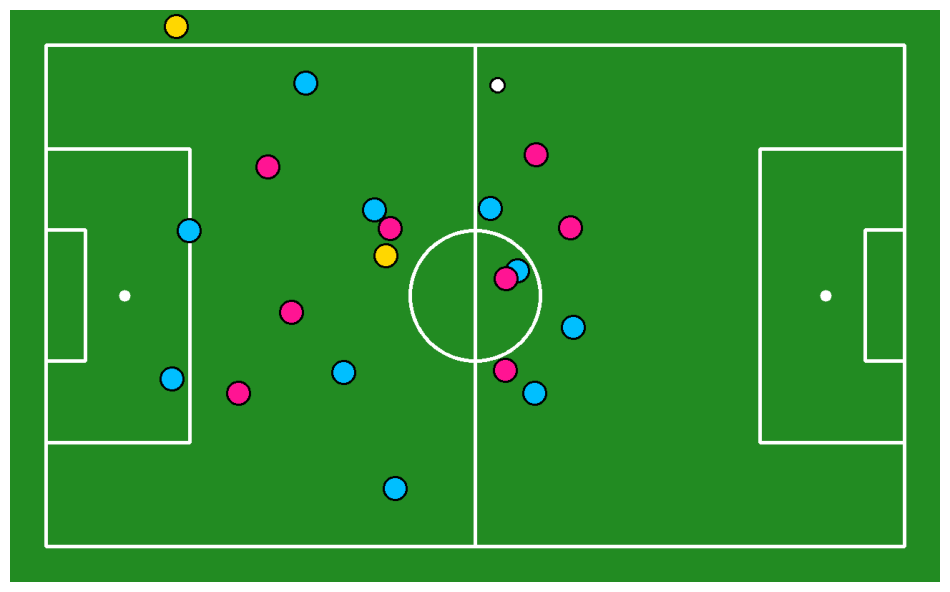

In [ ]:
import supervision as sv
from sports.common.team import TeamClassifier
from sports.annotators.soccer import draw_pitch, draw_points_on_pitch

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFREE_ID = 3

crops = extract_crops(SOURCE_VIDEO_PATH)
team_classifier = TeamClassifier(device=DEVICE)
team_classifier.fit(crops)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

player_detections = all_detections[all_detections.class_id == PLAYER_ID]
goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
refree_detections = all_detections[all_detections.class_id == REFREE_ID]

player_crops = [sv.crop_image(frame, xyxy) for xyxy in player_detections.xyxy]
player_detections.class_id = team_classifier.predict(player_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    player_detections, goalkeepers_detections
)

result = PITCH_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

pitch_reference_points = np.array(CONFIG.vertices)[filter]


view_transformer = ViewTransformer(
    source = frame_reference_points,
    target = pitch_reference_points
)

frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_ball_xy = view_transformer.transform_points(frame_ball_xy)

frame_players_xy = player_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_players_xy = view_transformer.transform_points(frame_players_xy)

frame_refree_xy = refree_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_refree_xy = view_transformer.transform_points(frame_refree_xy)

pitch = draw_pitch(config=CONFIG)
pitch = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_ball_xy,
    face_color=sv.Color.WHITE,
    edge_color=sv.Color.BLACK,
    pitch=pitch,
    radius=10
)

pitch = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[player_detections.class_id == 0],
    face_color=sv.Color.from_hex('#00BFFF'),
    edge_color=sv.Color.BLACK,
    pitch=pitch,
    radius=16
)

pitch = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[player_detections.class_id == 1],
    face_color=sv.Color.from_hex('#FF1493'),
    edge_color=sv.Color.BLACK,
    pitch=pitch,
    radius=16
)

pitch = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_refree_xy,
    face_color=sv.Color.from_hex('#FFD700'),
    edge_color=sv.Color.BLACK,
    pitch=pitch,
    radius=16
)

sv.plot_image(pitch)

# Video

In [ ]:
from tqdm import tqdm
import cv2
import numpy as np
import supervision as sv
from sports.common.team import TeamClassifier
from sports.annotators.soccer import draw_pitch, draw_points_on_pitch

# ---------- config ----------
SOURCE_VIDEO_PATH = "/content/121364_0.mp4"
TARGET_VIDEO_PATH = "/content/121364_0_result_6.mp4"

# class ids from your model
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFREE_ID = 3

# how tall the pitch panel should be relative to the broadcast frame
PITCH_REL_HEIGHT = 0.42  # 42% of the frame height

# ---------- team classifier ----------
crops = extract_crops(SOURCE_VIDEO_PATH)
team_classifier = TeamClassifier(device=DEVICE)
team_classifier.fit(crops)

# ---------- annotators for the broadcast frame ----------
ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER,
    smart_position=True
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

# ---------- tracker ----------
tracker = sv.ByteTrack()
tracker.reset()

# ---------- video io ----------
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_w, frame_h, fps = video_info.width, video_info.height, video_info.fps
pitch_h = int(frame_h * PITCH_REL_HEIGHT)

# Create an output VideoInfo with stacked height (frame + pitch)
out_info = sv.VideoInfo(width=frame_w, height=frame_h + pitch_h, fps=fps, total_frames=video_info.total_frames)
video_sink = sv.VideoSink(TARGET_VIDEO_PATH, video_info=out_info)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

# ---------- main loop ----------
with video_sink:
    for frame in tqdm(frame_generator, total=video_info.total_frames):

        # ===== 1) DETECT / TRACK on broadcast frame =====
        result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
        detections = sv.Detections.from_inference(result)

        ball_detections = detections[detections.class_id == BALL_ID]
        ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

        all_detections = detections[detections.class_id != BALL_ID]
        all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
        all_detections = tracker.update_with_detections(detections=all_detections)

        player_detections = all_detections[all_detections.class_id == PLAYER_ID]
        goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
        refree_detections = all_detections[all_detections.class_id == REFREE_ID]

        player_crops = [sv.crop_image(frame, xyxy) for xyxy in player_detections.xyxy]
        if len(player_crops):
            player_detections.class_id = team_classifier.predict(player_crops).astype(int)

        if len(goalkeepers_detections):
            goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
                player_detections, goalkeepers_detections
            ).astype(int)

        if len(refree_detections):
            refree_detections.class_id = (refree_detections.class_id - 1).astype(int)

        all_detections = sv.Detections.merge([player_detections, goalkeepers_detections, refree_detections])

        labels = [f"#{tracker_id}" for tracker_id in all_detections.tracker_id]

        # ===== 2) ANNOTATE BROADCAST FRAME (TOP) =====
        top = frame.copy()
        top = ellipse_annotator.annotate(scene=top, detections=all_detections)
        top = triangle_annotator.annotate(scene=top, detections=ball_detections)
        top = label_annotator.annotate(top, all_detections, labels)

        # ===== 3) BUILD PITCH VIEW (BOTTOM) USING HOMOGRAPHY =====
        # (a) detect pitch keypoints
        pitch_view = draw_pitch(config=CONFIG)  # base pitch image in its native size
        result_pitch = PITCH_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
        key_points = sv.KeyPoints.from_inference(result_pitch)

        # require reasonably confident kp's
        valid_mask = key_points.confidence[0] > 0.5
        frame_reference_points = key_points.xy[0][valid_mask]
        pitch_reference_points = np.array(CONFIG.vertices)[valid_mask]

        # (b) build transformer if we have enough points
        have_h = frame_reference_points.shape[0] >= 4 and pitch_reference_points.shape[0] >= 4
        if have_h:
            view_transformer = ViewTransformer(
                source=frame_reference_points,
                target=pitch_reference_points
            )

            # (c) collect bottom-center anchors in frame coords
            frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER) \
                            if len(ball_detections) else np.empty((0, 2), dtype=float)
            frame_players_xy = player_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER) \
                               if len(player_detections) else np.empty((0, 2), dtype=float)
            frame_refree_xy = refree_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER) \
                              if len(refree_detections) else np.empty((0, 2), dtype=float)

            # (d) transform to pitch coords
            pitch_ball_xy = view_transformer.transform_points(frame_ball_xy) if len(frame_ball_xy) else np.empty((0, 2), float)
            pitch_players_xy = view_transformer.transform_points(frame_players_xy) if len(frame_players_xy) else np.empty((0, 2), float)
            pitch_refree_xy = view_transformer.transform_points(frame_refree_xy) if len(frame_refree_xy) else np.empty((0, 2), float)

            # (e) draw on pitch by team/role
            # players team 0
            if len(pitch_players_xy):
                pitch_view = draw_points_on_pitch(
                    config=CONFIG,
                    xy=pitch_players_xy[player_detections.class_id == 0],
                    face_color=sv.Color.from_hex('#00BFFF'),
                    edge_color=sv.Color.BLACK,
                    pitch=pitch_view,
                    radius=16
                )
                # players team 1
                pitch_view = draw_points_on_pitch(
                    config=CONFIG,
                    xy=pitch_players_xy[player_detections.class_id == 1],
                    face_color=sv.Color.from_hex('#FF1493'),
                    edge_color=sv.Color.BLACK,
                    pitch=pitch_view,
                    radius=16
                )

            # goalkeepers (already assigned to a team id via resolve_goalkeepers_team_id)
            if len(goalkeepers_detections):
                frame_gk_xy = goalkeepers_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
                pitch_gk_xy = view_transformer.transform_points(frame_gk_xy)
                # draw with the same team coloring rule
                gk_team0 = pitch_gk_xy[goalkeepers_detections.class_id == 0]
                gk_team1 = pitch_gk_xy[goalkeepers_detections.class_id == 1]
                if len(gk_team0):
                    pitch_view = draw_points_on_pitch(
                        config=CONFIG, xy=gk_team0,
                        face_color=sv.Color.from_hex('#00BFFF'),
                        edge_color=sv.Color.BLACK, pitch=pitch_view, radius=18
                    )
                if len(gk_team1):
                    pitch_view = draw_points_on_pitch(
                        config=CONFIG, xy=gk_team1,
                        face_color=sv.Color.from_hex('#FF1493'),
                        edge_color=sv.Color.BLACK, pitch=pitch_view, radius=18
                    )

            # referees
            if len(pitch_refree_xy):
                pitch_view = draw_points_on_pitch(
                    config=CONFIG,
                    xy=pitch_refree_xy,
                    face_color=sv.Color.from_hex('#FFD700'),
                    edge_color=sv.Color.BLACK,
                    pitch=pitch_view,
                    radius=16
                )

            # ball
            if len(pitch_ball_xy):
                pitch_view = draw_points_on_pitch(
                    config=CONFIG,
                    xy=pitch_ball_xy,
                    face_color=sv.Color.WHITE,
                    edge_color=sv.Color.BLACK,
                    pitch=pitch_view,
                    radius=10
                )
        else:
            # not enough keypoints → keep clean pitch (still stacked so video remains consistent)
            pass

        # (f) resize pitch to match output width and desired height
        pitch_view_resized = cv2.resize(pitch_view, (frame_w, pitch_h), interpolation=cv2.INTER_AREA)

        # ===== 4) STACK AND WRITE =====
        stacked = cv2.vconcat([top, pitch_view_resized])
        video_sink.write_frame(stacked)


# Create a Voronoi Diagrame for the Pitch

collecting crops: 25it [00:09,  2.63it/s]
Embedding extraction: 15it [00:06,  2.18it/s]
Embedding extraction: 1it [00:00,  4.19it/s]


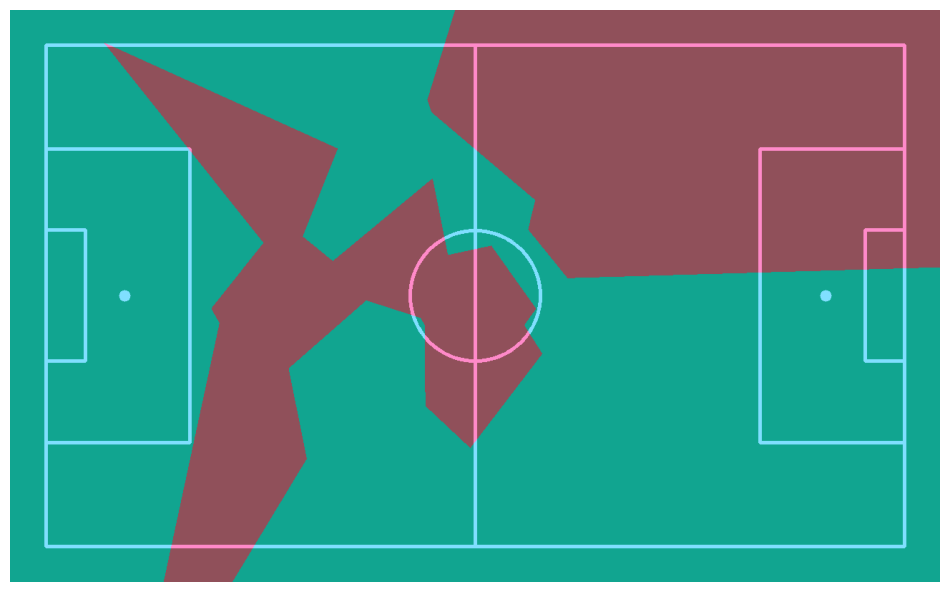

In [ ]:
import supervision as sv
from sports.common.team import TeamClassifier
from sports.annotators.soccer import draw_pitch, draw_points_on_pitch, draw_pitch_voronoi_diagram

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFREE_ID = 3

crops = extract_crops(SOURCE_VIDEO_PATH)
team_classifier = TeamClassifier(device=DEVICE)
team_classifier.fit(crops)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

player_detections = all_detections[all_detections.class_id == PLAYER_ID]
goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
refree_detections = all_detections[all_detections.class_id == REFREE_ID]

player_crops = [sv.crop_image(frame, xyxy) for xyxy in player_detections.xyxy]
player_detections.class_id = team_classifier.predict(player_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    player_detections, goalkeepers_detections
)

result = PITCH_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

pitch_reference_points = np.array(CONFIG.vertices)[filter]


view_transformer = ViewTransformer(
    source = frame_reference_points,
    target = pitch_reference_points
)

frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_ball_xy = view_transformer.transform_points(frame_ball_xy)

frame_players_xy = player_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_players_xy = view_transformer.transform_points(frame_players_xy)

frame_refree_xy = refree_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_refree_xy = view_transformer.transform_points(frame_refree_xy)

pitch = draw_pitch(config=CONFIG)
# pitch = draw_points_on_pitch(
#     config=CONFIG,
#     xy=pitch_ball_xy,
#     face_color=sv.Color.WHITE,
#     edge_color=sv.Color.BLACK,
#     pitch=pitch,
#     radius=10
# )

# pitch = draw_points_on_pitch(
#     config=CONFIG,
#     xy=pitch_players_xy[player_detections.class_id == 0],
#     face_color=sv.Color.from_hex('#00BFFF'),
#     edge_color=sv.Color.BLACK,
#     pitch=pitch,
#     radius=16
# )

# pitch = draw_points_on_pitch(
#     config=CONFIG,
#     xy=pitch_players_xy[player_detections.class_id == 1],
#     face_color=sv.Color.from_hex('#FF1493'),
#     edge_color=sv.Color.BLACK,
#     pitch=pitch,
#     radius=16
# )

# pitch = draw_points_on_pitch(
#     config=CONFIG,
#     xy=pitch_refree_xy,
#     face_color=sv.Color.from_hex('#FFD700'),
#     edge_color=sv.Color.BLACK,
#     pitch=pitch,
#     radius=16
# )
pitch = draw_pitch_voronoi_diagram(
    config=CONFIG,
    team_1_xy=pitch_players_xy[player_detections.class_id == 0],
    team_2_xy=pitch_players_xy[player_detections.class_id == 1],
    team_1_color=sv.Color.from_hex('#00BFFF'),
    team_2_color=sv.Color.from_hex('#FF1493'),
    pitch=pitch
)
sv.plot_image(pitch)

# Video

# ball tracking

In [ ]:
from collections import deque
import supervision as sv
from sports.annotators.soccer import draw_pitch, draw_points_on_pitch

SOURCE_VIDEO_PATH = "/content/121364_0.mp4"
BALL_ID = 0
MAXLEN = 5

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

path_raw = []
M = deque(maxlen=MAXLEN)

for frame in tqdm(frame_generator, total=video_info.total_frames):

  result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
  detections = sv.Detections.from_inference(result)

  ball_detections = detections[detections.class_id == BALL_ID]
  ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

  result = PITCH_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
  key_points = sv.KeyPoints.from_inference(result)

  filter = key_points.confidence[0] > 0.5
  frame_reference_points = key_points.xy[0][filter]
  pitch_reference_points = np.array(CONFIG.vertices)[filter]

  transformer = ViewTransformer(
      source=frame_reference_points,
      target=pitch_reference_points
  )
  M.append(transformer.m)
  transformer.m = np.mean(np.array(M), axis=0)

  frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
  pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)

  path_raw.append(pitch_ball_xy)

100%|██████████| 750/750 [02:36<00:00,  4.79it/s]


In [ ]:
path = [
    np.empty((0, 2), dtype=np.float32) if coorinates.shape[0] >= 2 else coorinates
    for coorinates
    in path_raw
]

path = [coorinates.flatten() for coorinates in path]

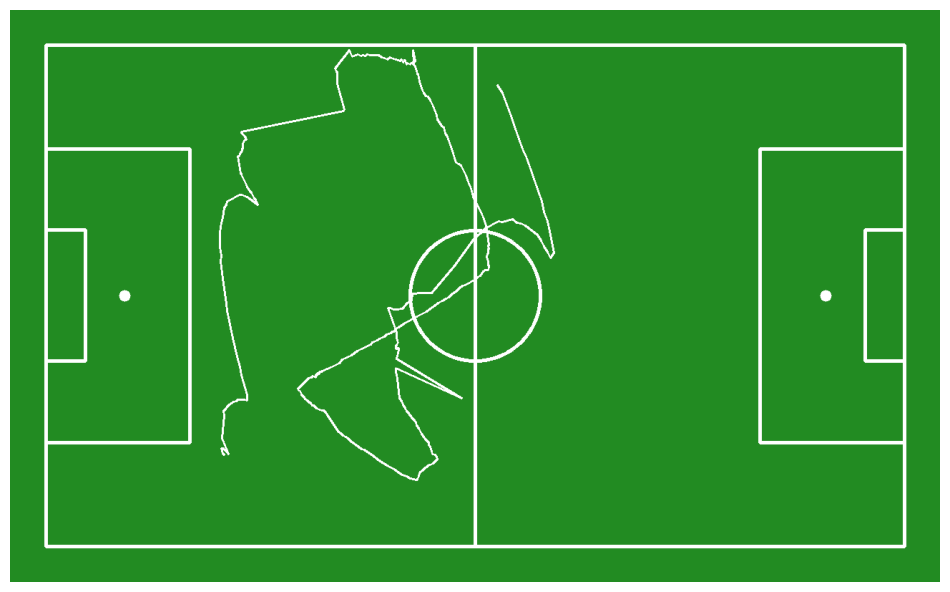

In [ ]:
from sports.annotators.soccer import draw_paths_on_pitch

annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_paths_on_pitch(
    config=CONFIG,
    paths=[path],
    color=sv.Color.WHITE,
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

In [ ]:
from typing import List, Union

def replace_outliers_based_on_distance(
    positions: List[np.ndarray],
    distance_threshold: float
) -> List[np.ndarray]:
    last_valid_position: Union[np.ndarray, None] = None
    cleaned_positions: List[np.ndarray] = []

    for position in positions:
        if len(position) == 0:
            # If the current position is already empty, just add it to the cleaned positions
            cleaned_positions.append(position)
        else:
            if last_valid_position is None:
                # If there's no valid last position, accept the first valid one
                cleaned_positions.append(position)
                last_valid_position = position
            else:
                # Calculate the distance from the last valid position
                distance = np.linalg.norm(position - last_valid_position)
                if distance > distance_threshold:
                    # Replace with empty array if the distance exceeds the threshold
                    cleaned_positions.append(np.array([], dtype=np.float64))
                else:
                    cleaned_positions.append(position)
                    last_valid_position = position

    return cleaned_positions

In [ ]:
MAX_DISTANCE_THRESHOLD = 500

path = replace_outliers_based_on_distance(path, MAX_DISTANCE_THRESHOLD)

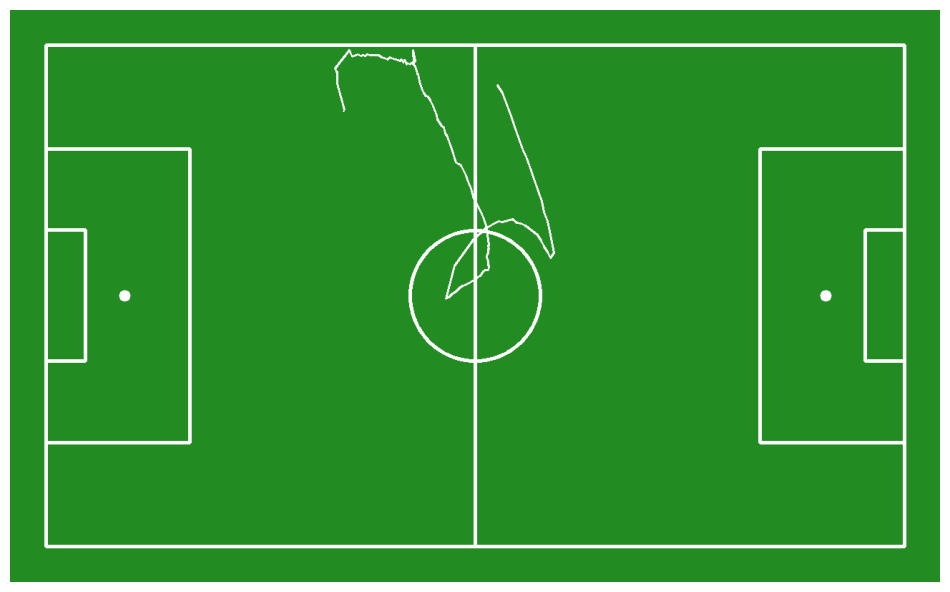

In [ ]:
from sports.annotators.soccer import draw_paths_on_pitch

annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_paths_on_pitch(
    config=CONFIG,
    paths=[path],
    color=sv.Color.WHITE,
    pitch=annotated_frame)

sv.plot_image(annotated_frame)